<a href="https://colab.research.google.com/github/nicolesbishop/Datascience/blob/main/PCA_Tutorial_Example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Principal Component Analysis: In-depth understanding through image visualization

## Introduction to Principal Component Analysis

Principal Component Analysis (PCA) is a popular dimensionality reduction technique used in Machine Learning applications. PCA condenses information from a large set of variables into fewer variables by applying some sort of transformation onto them. The transformation is applied in such a way that linearly correlated variables get transformed into uncorrelated variables. Correlation tells us that there is a redundancy of information and if this redundancy can be reduced, then information can be compressed. For example, if there are two variables in the variable set which are highly correlated, then, we are not gaining any extra information by retaining both the variables because one can be nearly expressed as the linear combination of the other. In such cases, **PCA transfers the variance of the second variable onto the first variable by translation and rotation of original axes and projecting data onto new axes**. The direction of projection is determined using eigenvalues and eigenvectors. So, the first few transformed features (termed as Principal Components) are rich in information, whereas the last features contain mostly noise with negligible information in them. This transferability allows us to retain the first few principal components, thus reducing the number of variables significantly with minimal loss of information.

This workbook focuses on practical step-by-step PCA implementation on Image data rather than a theoretical explanation as there are tons of materials already available for that. The image data has been chosen over tabular data so that the reader can better understand the working of PCA through image visualization. Technically, an image is a matrix of pixels whose brightness represents the reflectance of surface features within that pixel. The reflectance value ranges from 0 to 255 for an 8-bit integer image. So the pixels with zero reflectance would appear as black, pixels with value 255 appear as pure white and pixels with value in-between appear in a gray tone. 
1. Landsat TM satellite Images, captured over the coastal region of India, have been used in this tutorial. 
2. The images are resized to a smaller scale to reduce computational load on the CPU. 
3. The image set consists of 7 band images captured across the blue, green, red, near-infrared (NIR) and mid-infrared (MIR) range of the electromagnetic spectrum. For readers who are interested in trying out steps on their own, kindly refer to [this Github repository](https://github.com/Skumarr53/Principal-Component-Analysis-testing-on-Image-data) that contains Input datasets and the Ipython code used here. Let’s get started without further ado.

### 1. Loading modules and Image data
The first step is to import the required libraries and load data. To make accessibility and processing easier, the band images are stacked in a 3d numpy array of sizes 850 x 1100 x 7 (height x width x no of bands). The color image shown below is a composite of Red, Green, and Blue (RGB) band images, reproducing the same view as it would have appeared to us. Get a glimpse of the scene.

In [ ]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import cv2
import numpy as np


Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
image size =  (850, 1100)


Dispalying colour image of the scene


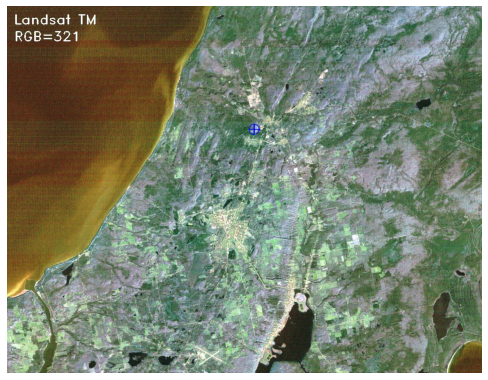

In [ ]:
#import google driver
from google.colab import drive
drive.mount("/content/drive/")

# Read RGB image into an array
img = cv2.imread('/content/sample_data/band321.jpg') ## put images into the GoogleDrive Folder
img_shape = img.shape[:2]
print('image size = ',img_shape)
# specify no of bands in the image
n_bands = 7
# 3 dimensional dummy array with zeros
MB_img = np.zeros((img_shape[0],img_shape[1],n_bands))
# stacking up images into the array
for i in range(n_bands):
    MB_img[:,:,i] = cv2.imread('/content/sample_data/band'+str(i+1)+'.jpg',   ##put series of images into the GoogleDrive folder
                               cv2.IMREAD_GRAYSCALE)  
# Let's take a look at scene
print('\n\nDispalying colour image of the scene')
plt.figure(figsize=(img_shape[0]/100,img_shape[1]/100))
plt.imshow(img, vmin=0, vmax=255)
plt.axis('off');

The image scene encompasses various surface features such as water, built-up area, forest, and farmland.

## 2. Data Exploration
Let us take a look at the reflectances of individual band images for different features and try to get some insight into the features in the band images

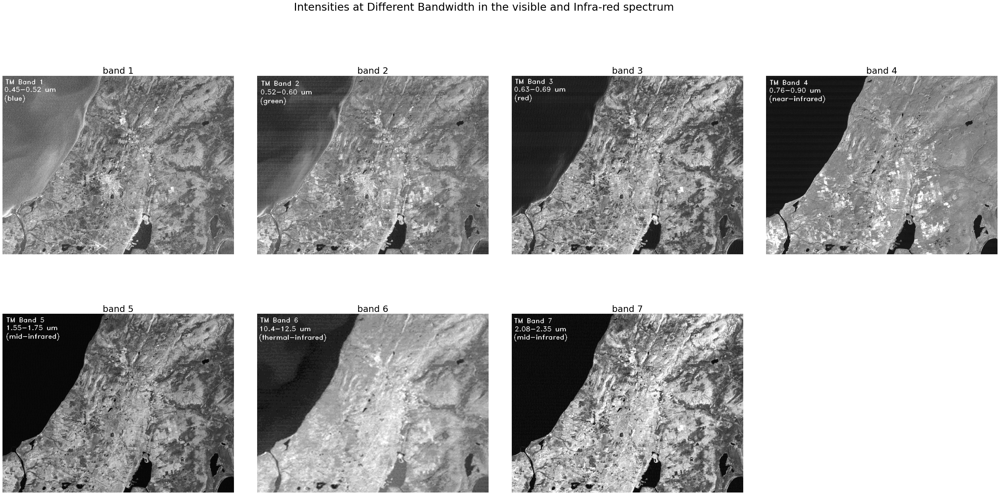

In [ ]:
# see the 
import matplotlib.pyplot as plt
import matplotlib.gridspec as grid

fig,axes = plt.subplots(2,4,figsize=(50,23),sharex='all', sharey='all')   #img_shape[0]/50,img_shape[1]/50
fig.subplots_adjust(wspace=0.1, hspace=0.15)
fig.suptitle('Intensities at Different Bandwidth in the visible and Infra-red spectrum', fontsize=30)


axes = axes.ravel()
for i in range(n_bands):
    axes[i].imshow(MB_img[:,:,i],cmap='gray', vmin=0, vmax=255)
    axes[i].set_title('band '+str(i+1),fontsize=25)
    axes[i].axis('off')

fig.delaxes(axes[-1])

### 3. Data standardization
Before applying PCA, we have to bring our data to common format through standardization.The purpose of doing this is to make sure that variables are internally consistent with each other regardless of their type. For example, if a dataset has two variables temperature measured in degree Celsius and rainfall measured in cm. Since the variables range and units are different, it is not advisable to use dissimilar variables as it is, otherwise variables differing in order of magnitude may introduce model bias towards some variables. Standardization is done centering the variable by subtracting mean and then bringing them to common scale by dividing standard deviation. Since the variables (band images) we are dealing with have similar range, standardization not really necessary, but still applying it is a good practice.

In [ ]:
# Convert 2d band array in 1-d to make them as feature vectors and Standardization  

MB_matrix = np.zeros((MB_img[:,:,0].size,n_bands))
for i in range(n_bands):
    MB_array = MB_img[:,:,i].flatten()  # covert 2d to 1d array 
    MB_arrayStd = (MB_array - MB_array.mean())/MB_array.std()  # Standardize each variable 
    MB_matrix[:,i] = MB_arrayStd
MB_matrix.shape;

### 4. Understand PCA transformation
Let us understand little bit more about the axes transformation that happens within PCA and its working. The scatter plot below shows correlation between green and red band data. The original axes (X1, Y1) are now transformed into principal components axes (X2, Y2) defined by Eigen vectors of variables covariance matrix and data projected on these new axes are Principal Components. It is important to notice that correlation existed in original data is eliminated after transformation onto (X2, Y2) space. One more thing worth noting is that variance of PCs along X2 axis higher than variance of original data along X1 and Y1 axis which means better representation of surface features, whereas the Variability of PCs along Y2 is less significant so holds relatively less information about surface features.

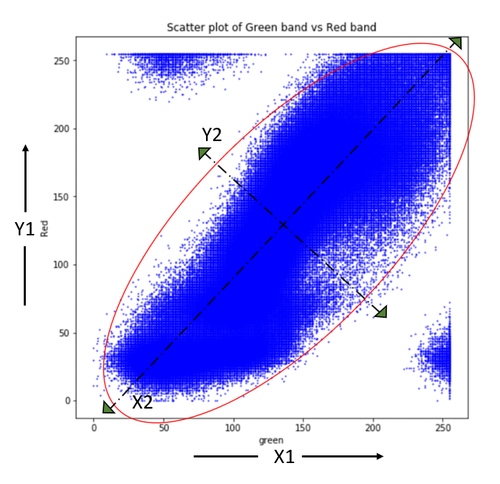

In [ ]:
from PIL import Image

im = Image.open('/content/sample_data/Original_and_Transformed_axes.PNG')
im.thumbnail((500,490), Image.ANTIALIAS)
im

### 5. Eigen values and vectors computation
Our variables which are image 2-d arrays needs to be converted to 1-d vector by flattening in order to facilitate Matrix computation. Lets create variable matrix of size 935000 X 7 (number of pixels in band X no of bands) and store these 1-d vectors in it. Now calculate the eigenvectors and corresponding eigenvalues of the covariance matrix

In [ ]:
# Covariance
np.set_printoptions(precision=3)
cov = np.cov(MB_matrix.transpose())

# Eigen Values
EigVal,EigVec = np.linalg.eig(cov)

print("Eigen values:\n\n", EigVal,"\n")

Eigen values:

 [5.508 0.796 0.249 0.167 0.088 0.064 0.128] 



In this step, data compression and dimensionality reduction comes into picture. If you look at eigen values you will notice that values are quite different. These values give us the order of significance of eigen vectors or directions i.e axis along eigenvector with largest eigenvalue is the most significant PC axis and so on. Next step is to order eigenvectors by their eigenvalue, highest to lowest, to rearrange components in order of significance. We have to project the data in the directions of ordered eigenvectors which inturn results to principal components.

In [ ]:
# Ordering Eigen values and vectors
order = EigVal.argsort()[::-1]
EigVal = EigVal[order]
EigVec = EigVec[:,order]

#Projecting data on Eigen vector directions resulting to Principal Components 
PC = np.matmul(MB_matrix,EigVec)   #cross product

### 6. Validation of Principal Components
Dependencies check
We were able to produce principal components sucessufully. Now, Let's validate the PCs to check whether they could able to reduce redundancy and also the extent to which data compression was achieved. we will create the scatter plots to visulaize the pairwise relatonship in the original bands and compare the same with pairwise relationship of PCs to test existance of dependancies.

Text(0.5, 0.98, 'Pair plot of PCs')

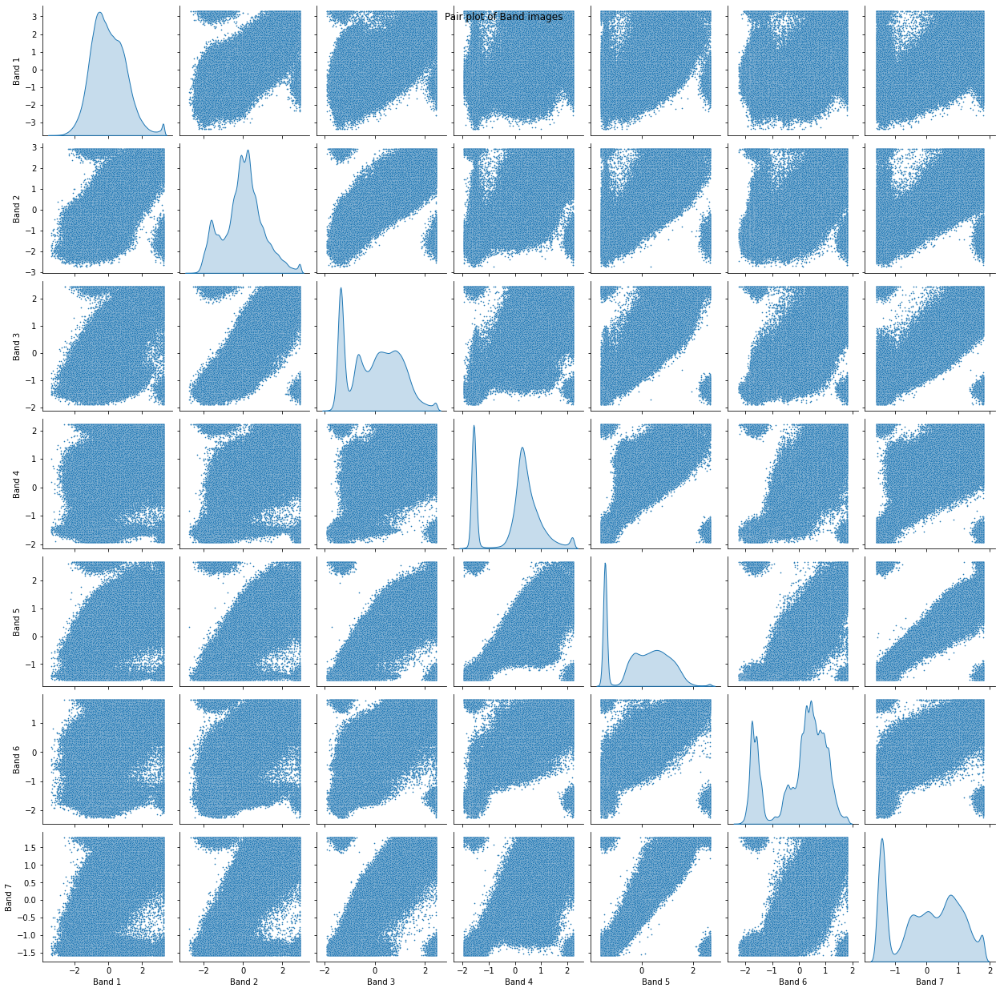

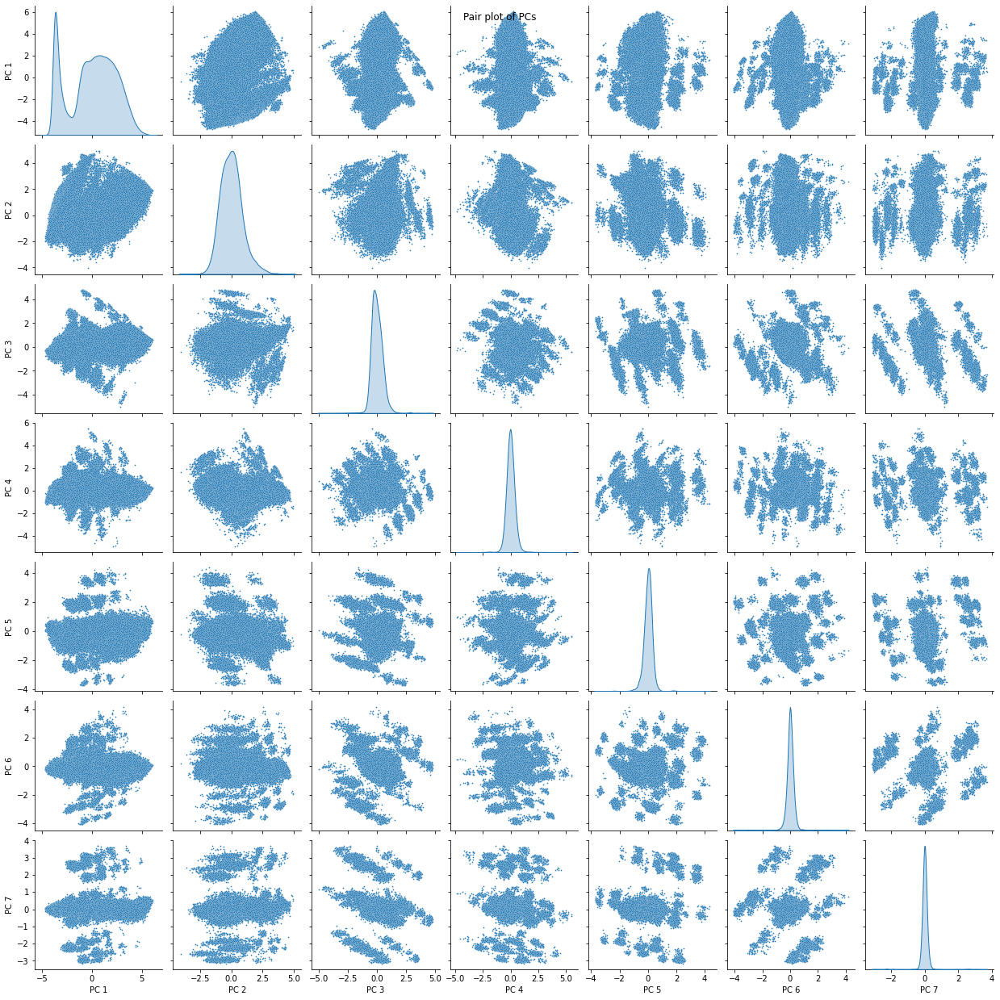

In [ ]:
# Generate Paiplot for original data and transformed PCs 
a = sns.pairplot(pd.DataFrame(MB_matrix,columns = ['Band 1','Band 2','Band 3','Band 4','Band 5','Band 6','Band 7']),diag_kind='kde',plot_kws={"s": 3})
a.fig.suptitle("Pair plot of Band images")
b = sns.pairplot(pd.DataFrame(PC, columns = ['PC 1','PC 2','PC 3','PC 4','PC 5','PC 6','PC 7']),diag_kind='kde',plot_kws={"s": 3})
b.fig.suptitle("Pair plot of PCs")

Let's take a look at pair plots, notice the depednecies between variables which exist in the original data has disappeared in the pricipal components. so, it is evident that PCA was able to reduce depednecies significantly. The distribution plots along the diagnol tell us that PCA was also successful in extracting variance from orignal high dimensional data which can be associated with compressablilty.

**compressibility check**


First three PCs retain 93 % of information


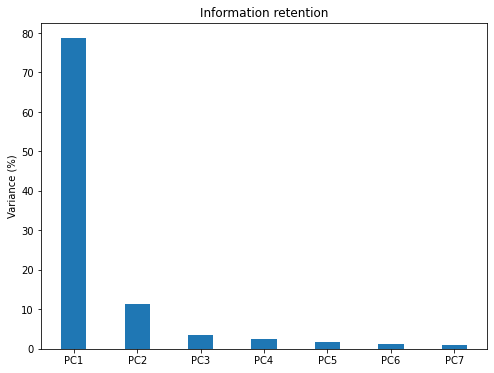

In [43]:
#Information Retained by Principal Components
plt.figure(figsize=(8,6))
plt.bar([1,2,3,4,5,6,7],EigVal/sum(EigVal)*100,align='center',width=0.4,tick_label = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7'])
plt.ylabel('Variance (%)')
plt.title('Information retention');

print("\nFirst three PCs retain "+str(int(sum(EigVal[:3])/sum(EigVal)*100))+" % of information")

The Bar plot of Eigenvalues expressed in percentage plotted above gives us the information retained in each PC. Notice that the last PCs eigenvalues are small and are less significant, this is where dimensionalilty reduction comes into play. If we choose to keep first three relevant components that retains 93% information then the final data is reduced from 7 dimension to 3 with out losing much information.

### 7. converting Components back to Images
It's time to reshape 1-d PCs back to original image shape and normalize PCs between 0 and 255 which is same has original image range to make image visualization possible

In [44]:
# Rearranging 1-d arrays to 2-d arrays of image size
PC_2d = np.zeros((img_shape[0],img_shape[1],n_bands))
for i in range(n_bands):
    PC_2d[:,:,i] = PC[:,i].reshape(-1,img_shape[1])

# narmalizing between 0 to 255
PC_2d_Norm = np.zeros((img_shape[0],img_shape[1],n_bands))
for i in range(n_bands):
    PC_2d_Norm[:,:,i] = cv2.normalize(PC_2d[:,:,i],  np.zeros(img_shape),0,255 ,cv2.NORM_MINMAX)

Let's understand the compression through visualization PC images.

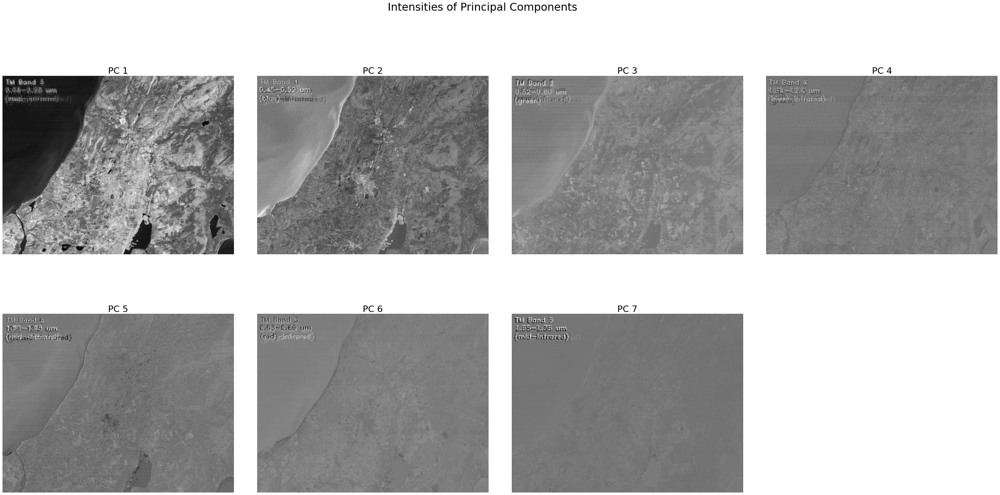

In [45]:
fig,axes = plt.subplots(2,4,figsize=(50,23),sharex='all', sharey='all')   #img_shape[0]/50,img_shape[1]/50
fig.subplots_adjust(wspace=0.1, hspace=0.15)
fig.suptitle('Intensities of Principal Components ', fontsize=30)


axes = axes.ravel()
for i in range(n_bands):
    axes[i].imshow(PC_2d_Norm[:,:,i],cmap='gray', vmin=0, vmax=255)
    axes[i].set_title('PC '+str(i+1),fontsize=25)
    axes[i].axis('off')
fig.delaxes(axes[-1])

Notice that first few PCs have rich information and are clear and as we move towards end, the PCs strats losing information with last PCs mostly containing noise. We will retain first three PCs and discard the rest. This will useful in improving data quality by removing noise and also processing by machine learning algorithms efficient interms of time and memory going forward.

### **Comparsion of RGB composite image with PC composite images**

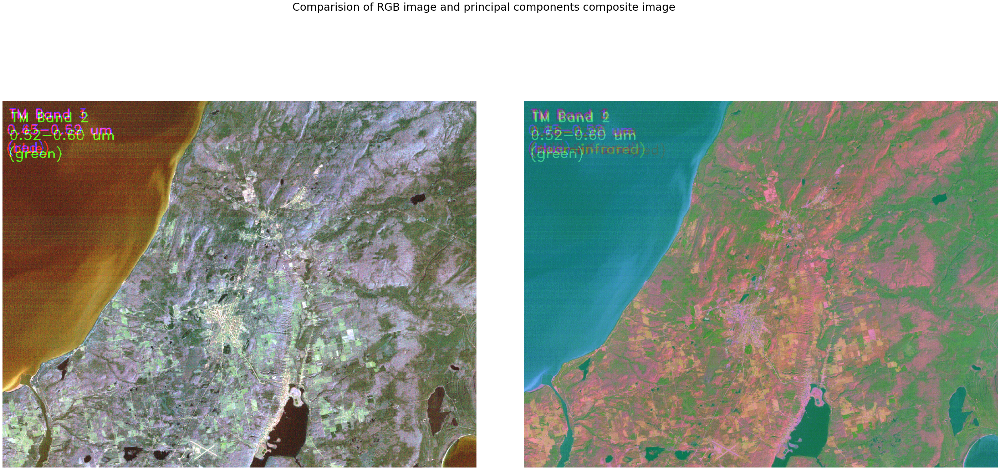

In [46]:
# Comparsion of RGB and Image produced using first three bands
fig,axes = plt.subplots(1,2,figsize=(50,23),sharex='all', sharey='all')   #img_shape[0]/50,img_shape[1]/50
fig.subplots_adjust(wspace=0.1, hspace=0.15)
fig.suptitle('Comparision of RGB image and principal components composite image', fontsize=30)
#axes[0].figure(figsize=(img_shape[0]/150,img_shape[1]/150))
#axes[0].imshow(img, vmin=0, vmax=255)
axes[0].imshow(MB_img[:,:,0:3].astype(int))
axes[0].axis('off');
#axes[1].figure(figsize=(img_shape[0]/150,img_shape[1]/150))
axes[1].imshow(PC_2d_Norm[:,:,:3][:,:,[0,2,1]].astype(int))
axes[1].axis('off');

Finally, we reproduced the scene using first three Principal components. The image on the left apppears more colourful than the original image RGB which makes the features in the scene appear more clear and distinguishable from each other. Also some features appear more prominent on the PC composite image that are difficult to identify on the right image. So, it can be concluded that the PCA has done a great job in terms of compressability and information retention.

I recommend you use this code for testing PCA on image data of your choice.